# Trabajo Practico II - Analisis Predictivo
## Abril Noguera

**Descargar la base:**

In [172]:
import pandas as pd 
import numpy as np

In [445]:
df_tr = pd.read_csv("Data/df_tr.csv")

In [386]:
df_va = pd.read_csv("Data/df_va.csv")

In [301]:
df_tr.head()

,Unnamed: 0,SEXO,EDAD,NACIO,RAMA,T_UNIV,DISCA,LUG_RES_PAIS,PAIS_NAC_PADRE,ESTUDIOS_PADRE,...,F_TEOR_TR,F_PRAC_TR,F_IDIOM_TR,F_TECH_TR,F_PERSON_TR,F_GEST_TR,OTRO_TRAB,EST_CIVIL,HOGAR,EMPLEADO_PRODUCTIVO
0,1,H,1_<30,E,CCSS,PuV,No,E,E,2_PI,...,1,4,5,3,4,4,No,1_S,4_PcH,Si
1,2,H,1_<30,E,CCSS,PuV,No,E,E,3_PC,...,5,5,5,4,5,4,No,1_S,1_UNI,Si
2,3,H,1_<30,E,CCSS,PuP,No,E,E,7_PS,...,2,5,5,5,5,5,No,1_S,3_PsH,Si
3,4,H,1_<30,E,CCSS,PuP,No,E,E,8_U,...,0,0,0,0,0,0,D,1_S,5_Otr,No
4,5,H,1_<30,E,CCSS,PuP,No,E,E,3_PC,...,3,4,3,5,5,5,Si,1_S,2_ScH,No


In [176]:
print(df_tr.shape)

(19905, 45)


**Split:**

In [368]:
from sklearn.model_selection import train_test_split

In [369]:
import random
random.seed(10)

In [370]:
X_train, X_test, y_train, y_test = train_test_split(df_tr.iloc[:,1:44], df_tr['EMPLEADO_PRODUCTIVO'], test_size=0.2)

print(X_train.shape), print(y_train.shape)
print(X_test.shape), print(y_test.shape)

(15924, 43)
(15924,)
(3981, 43)
(3981,)


(None, None)

**Preparacion de la Base:**

Para el analisis se toman las variables que describen la situacion del recien graduado, y la variable target es la creada "Empleado Productivo". Se deben quitar del analisis todas las variables que tengan relacion con la situacion laboral actual del graduado.

In [371]:
# 'SIT_LABORAL', 'SIT_PROFESIONAL', 'TR_SUELDO', 'FORMAC_TR', 'RAMA_TR', 'USO_ESTUD_TR', 'F_TEOR_TR', 'F_PRAC_TR', 'F_IDIOM_TR', 'F_TECH_TR', 'F_PERSON_TR', 'F_GEST_TR', 'OTRO_TRAB'

X_train = X_train.drop(['SIT_LABORAL', 'SIT_PROFESIONAL', 'TR_SUELDO', 'FORMAC_TR', 'RAMA_TR', 'USO_ESTUD_TR', 'F_TEOR_TR', 'F_PRAC_TR', 'F_IDIOM_TR', 'F_TECH_TR', 'F_PERSON_TR', 'F_GEST_TR', 'OTRO_TRAB'], axis=1)
X_test = X_test.drop(['SIT_LABORAL', 'SIT_PROFESIONAL', 'TR_SUELDO', 'FORMAC_TR', 'RAMA_TR', 'USO_ESTUD_TR', 'F_TEOR_TR', 'F_PRAC_TR', 'F_IDIOM_TR', 'F_TECH_TR', 'F_PERSON_TR', 'F_GEST_TR', 'OTRO_TRAB'], axis=1)

Identifico las variables categoricas: 

In [372]:
X_train.select_dtypes(include='object').columns

Index(['SEXO', 'EDAD', 'NACIO', 'RAMA', 'T_UNIV', 'DISCA', 'LUG_RES_PAIS',
       'PAIS_NAC_PADRE', 'ESTUDIOS_PADRE', 'PAIS_NAC_MADRE', 'ESTUDIOS_MADRE',
       'BECA', 'EXTRANJERO', 'MOTIVO', 'VOLVERIA', 'MISMA_CARRERA',
       'OTRO_GRADO', 'MASTER', 'DOCTORADO', 'EST_ARTIST', 'CICLO_SUP',
       'CICLO_MED', 'OTROS_EST', 'TECH', 'MV_ESP', 'MV_FUE', 'EST_CIVIL',
       'HOGAR'],
      dtype='object')

In [373]:
cat_features = X_train.select_dtypes(include='object').columns.tolist()
cat_features

['SEXO',
 'EDAD',
 'NACIO',
 'RAMA',
 'T_UNIV',
 'DISCA',
 'LUG_RES_PAIS',
 'PAIS_NAC_PADRE',
 'ESTUDIOS_PADRE',
 'PAIS_NAC_MADRE',
 'ESTUDIOS_MADRE',
 'BECA',
 'EXTRANJERO',
 'MOTIVO',
 'VOLVERIA',
 'MISMA_CARRERA',
 'OTRO_GRADO',
 'MASTER',
 'DOCTORADO',
 'EST_ARTIST',
 'CICLO_SUP',
 'CICLO_MED',
 'OTROS_EST',
 'TECH',
 'MV_ESP',
 'MV_FUE',
 'EST_CIVIL',
 'HOGAR']

Convierto la variable target a una variable numerica:

In [374]:
y_train = pd.get_dummies(y_train).drop(columns='No').rename(columns = {'Si':'EMPLEADO_PRODUCTIVO'})
y_test = pd.get_dummies(y_test).drop(columns='No').rename(columns = {'Si':'EMPLEADO_PRODUCTIVO'})

**Metricas de Clasificacion:**

Para tomar una decisión sobre la métrica de clasificación a utilizar analizo la importancia que le quiero dar a las categorías del target. En este caso, el hecho de que sea o no productivo no me genera mayor o menor inquietud, si no que solo me interesa separar ambos grupos. Por eso decido que el precision y el recall estén balanceados. 

Para empezar, las clases de la variable target "Si" y "No" están balanceadas. Por lo que el accuracy podría ser una buena métrica de clasificación. Si destinamos todas las respuestas del modelo a una de las clases el accuracy no sería alto, es decir, la base line es baja. 

Decido usar como métrica de clasificación el Área por Debajo de la Curva del ROC (AUROC). Con esta métrica buscaremos un modelo que va a ser bueno "globalmente" y va a ser capaz de discriminar bien entre 0s y 1s.

In [376]:
scoring = {
    "Accuracy": "accuracy",
    "AUC": "roc_auc"
}

**Modelos Predictivos:**

Como las variables son categoricas primero probare como ajusta el modelo CatBoost, ya que no es necesario normalizar estas variables con One Hot Encoding antes.

In [377]:
from sklearn import metrics
from sklearn.metrics import (
    mean_squared_error, r2_score, accuracy_score, roc_auc_score, average_precision_score, classification_report, 
    roc_curve, auc, confusion_matrix, precision_recall_fscore_support, 
    ConfusionMatrixDisplay
)

In [310]:
#!pip install scikit-plot

In [311]:
from scikitplot.metrics import plot_roc, plot_confusion_matrix, plot_precision_recall



*   *Catboost:*

In [188]:
# !pip install catboost

In [378]:
from catboost import CatBoostClassifier, Pool
import matplotlib.pyplot as plt
import seaborn as sns

In [379]:
train_dataset = Pool(X_train, y_train, cat_features= cat_features)
test_dataset = Pool(X_test, y_test, cat_features= cat_features)

In [314]:
model = CatBoostClassifier(loss_function="Logloss")

model = model.fit(train_dataset)

Learning rate set to 0.03359
0:	learn: 0.6873697	total: 18.1ms	remaining: 18.1s
1:	learn: 0.6821652	total: 34.1ms	remaining: 17s
2:	learn: 0.6774769	total: 45.4ms	remaining: 15.1s
3:	learn: 0.6728398	total: 77.3ms	remaining: 19.2s
4:	learn: 0.6684558	total: 98.4ms	remaining: 19.6s
5:	learn: 0.6642649	total: 113ms	remaining: 18.8s
6:	learn: 0.6606390	total: 127ms	remaining: 18.1s
7:	learn: 0.6573037	total: 139ms	remaining: 17.2s
8:	learn: 0.6539654	total: 154ms	remaining: 17s
9:	learn: 0.6508024	total: 170ms	remaining: 16.8s
10:	learn: 0.6480065	total: 180ms	remaining: 16.2s
11:	learn: 0.6452696	total: 191ms	remaining: 15.7s
12:	learn: 0.6424887	total: 201ms	remaining: 15.3s
13:	learn: 0.6400696	total: 215ms	remaining: 15.1s
14:	learn: 0.6378989	total: 225ms	remaining: 14.8s
15:	learn: 0.6358614	total: 241ms	remaining: 14.8s
16:	learn: 0.6339424	total: 254ms	remaining: 14.7s
17:	learn: 0.6319940	total: 271ms	remaining: 14.8s
18:	learn: 0.6302011	total: 283ms	remaining: 14.6s
19:	learn: 

In [256]:
pred = model.predict(X_test)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.679
              precision    recall  f1-score   support

           0       0.67      0.58      0.62      1743
           1       0.70      0.78      0.74      2238

    accuracy                           0.69      3981
   macro avg       0.69      0.68      0.68      3981
weighted avg       0.69      0.69      0.69      3981

[[1003  740]
 [ 486 1752]]


---

In [257]:
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1, 0.15, 0.2],
        'depth': [6, 8, 10 ,12],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [394]:
model = CatBoostClassifier(loss_function="Logloss")

model.grid_search(grid, train_dataset)

0:	learn: 0.6915900	test: 0.6915826	best: 0.6915826 (0)	total: 39.7ms	remaining: 7.89s
1:	learn: 0.6899915	test: 0.6899753	best: 0.6899753 (1)	total: 73.9ms	remaining: 7.32s
2:	learn: 0.6885185	test: 0.6884712	best: 0.6884712 (2)	total: 112ms	remaining: 7.38s
3:	learn: 0.6869501	test: 0.6869281	best: 0.6869281 (3)	total: 162ms	remaining: 7.94s
4:	learn: 0.6855201	test: 0.6854755	best: 0.6854755 (4)	total: 198ms	remaining: 7.72s
5:	learn: 0.6839683	test: 0.6839253	best: 0.6839253 (5)	total: 236ms	remaining: 7.63s
6:	learn: 0.6826396	test: 0.6826116	best: 0.6826116 (6)	total: 261ms	remaining: 7.18s
7:	learn: 0.6812210	test: 0.6811854	best: 0.6811854 (7)	total: 290ms	remaining: 6.96s
8:	learn: 0.6798706	test: 0.6798364	best: 0.6798364 (8)	total: 316ms	remaining: 6.71s
9:	learn: 0.6785046	test: 0.6784631	best: 0.6784631 (9)	total: 343ms	remaining: 6.51s
10:	learn: 0.6772138	test: 0.6771876	best: 0.6771876 (10)	total: 372ms	remaining: 6.39s
11:	learn: 0.6760622	test: 0.6760165	best: 0.67601

{'params': {'depth': 10,
  'l2_leaf_reg': 5,
  'iterations': 200,
  'learning_rate': 0.03},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [260]:
# 'params': {'depth': 10, 'l2_leaf_reg': 3, 'iterations': 200, 'learning_rate': 0.03}
model = CatBoostClassifier(loss_function="Logloss", depth = 10, l2_leaf_reg = 3, iterations = 200, learning_rate = 0.03 )
model.fit(train_dataset)

0:	learn: 0.6868171	total: 46.9ms	remaining: 9.33s
1:	learn: 0.6813420	total: 84.5ms	remaining: 8.36s
2:	learn: 0.6765562	total: 122ms	remaining: 8.04s
3:	learn: 0.6709655	total: 172ms	remaining: 8.42s
4:	learn: 0.6656721	total: 217ms	remaining: 8.45s
5:	learn: 0.6612314	total: 261ms	remaining: 8.45s
6:	learn: 0.6571209	total: 310ms	remaining: 8.55s
7:	learn: 0.6532293	total: 358ms	remaining: 8.58s
8:	learn: 0.6497616	total: 397ms	remaining: 8.43s
9:	learn: 0.6468496	total: 410ms	remaining: 7.8s
10:	learn: 0.6436443	total: 450ms	remaining: 7.74s
11:	learn: 0.6407323	total: 512ms	remaining: 8.02s
12:	learn: 0.6383979	total: 530ms	remaining: 7.62s
13:	learn: 0.6362658	total: 549ms	remaining: 7.3s
14:	learn: 0.6337790	total: 614ms	remaining: 7.57s
15:	learn: 0.6311639	total: 671ms	remaining: 7.71s
16:	learn: 0.6286366	total: 725ms	remaining: 7.8s
17:	learn: 0.6266489	total: 758ms	remaining: 7.66s
18:	learn: 0.6254981	total: 763ms	remaining: 7.27s
19:	learn: 0.6237508	total: 820ms	remainin

In [261]:
pred = model.predict(X_test)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.678
              precision    recall  f1-score   support

           0       0.68      0.56      0.62      1743
           1       0.70      0.79      0.74      2238

    accuracy                           0.69      3981
   macro avg       0.69      0.68      0.68      3981
weighted avg       0.69      0.69      0.69      3981

[[ 983  760]
 [ 464 1774]]


Vuelvo a probar otro grid search.

---

In [262]:
grid = {'iterations': [200, 300, 400, 500],
        'learning_rate': [0.01, 0.03, 0.1],
        'depth': [6, 8, 10 ,12],
        'l2_leaf_reg': [0.5, 1, 3, 5]}

In [263]:
model = CatBoostClassifier(loss_function="Logloss")

model.grid_search(grid, train_dataset)

0:	learn: 0.6916171	test: 0.6915825	best: 0.6915825 (0)	total: 44.3ms	remaining: 8.82s
1:	learn: 0.6900503	test: 0.6899994	best: 0.6899994 (1)	total: 72.4ms	remaining: 7.16s
2:	learn: 0.6886465	test: 0.6885728	best: 0.6885728 (2)	total: 102ms	remaining: 6.67s
3:	learn: 0.6871258	test: 0.6870370	best: 0.6870370 (3)	total: 132ms	remaining: 6.45s
4:	learn: 0.6857317	test: 0.6856061	best: 0.6856061 (4)	total: 147ms	remaining: 5.74s
5:	learn: 0.6843243	test: 0.6841827	best: 0.6841827 (5)	total: 174ms	remaining: 5.63s
6:	learn: 0.6829042	test: 0.6827499	best: 0.6827499 (6)	total: 199ms	remaining: 5.47s
7:	learn: 0.6815324	test: 0.6813715	best: 0.6813715 (7)	total: 220ms	remaining: 5.29s
8:	learn: 0.6800780	test: 0.6798836	best: 0.6798836 (8)	total: 243ms	remaining: 5.16s
9:	learn: 0.6788052	test: 0.6785732	best: 0.6785732 (9)	total: 264ms	remaining: 5.02s
10:	learn: 0.6774621	test: 0.6772060	best: 0.6772060 (10)	total: 288ms	remaining: 4.95s
11:	learn: 0.6762586	test: 0.6759705	best: 0.67597

{'params': {'depth': 10,
  'l2_leaf_reg': 3,
  'iterations': 400,
  'learning_rate': 0.03},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [380]:
# 'params': {'depth': 10, 'l2_leaf_reg': 3, 'iterations': 400, 'learning_rate': 0.03}
model = CatBoostClassifier(loss_function="Logloss", depth = 10, l2_leaf_reg = 3, iterations = 400, learning_rate = 0.03 )
model.fit(train_dataset)

0:	learn: 0.6869775	total: 78.9ms	remaining: 31.5s
1:	learn: 0.6816382	total: 123ms	remaining: 24.5s
2:	learn: 0.6765852	total: 166ms	remaining: 22s
3:	learn: 0.6720134	total: 184ms	remaining: 18.2s
4:	learn: 0.6668579	total: 229ms	remaining: 18.1s
5:	learn: 0.6631300	total: 270ms	remaining: 17.7s
6:	learn: 0.6591125	total: 309ms	remaining: 17.3s
7:	learn: 0.6551470	total: 364ms	remaining: 17.8s
8:	learn: 0.6516209	total: 406ms	remaining: 17.6s
9:	learn: 0.6477727	total: 463ms	remaining: 18.1s
10:	learn: 0.6446805	total: 507ms	remaining: 17.9s
11:	learn: 0.6416154	total: 555ms	remaining: 17.9s
12:	learn: 0.6379548	total: 617ms	remaining: 18.4s
13:	learn: 0.6353069	total: 667ms	remaining: 18.4s
14:	learn: 0.6327011	total: 743ms	remaining: 19.1s
15:	learn: 0.6295397	total: 804ms	remaining: 19.3s
16:	learn: 0.6264518	total: 856ms	remaining: 19.3s
17:	learn: 0.6237387	total: 916ms	remaining: 19.4s
18:	learn: 0.6223007	total: 928ms	remaining: 18.6s
19:	learn: 0.6198993	total: 1s	remaining: 

In [316]:
pred = model.predict(X_test)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.658
              precision    recall  f1-score   support

           0       0.64      0.54      0.59      1704
           1       0.69      0.78      0.73      2277

    accuracy                           0.67      3981
   macro avg       0.67      0.66      0.66      3981
weighted avg       0.67      0.67      0.67      3981

[[ 920  784]
 [ 512 1765]]


In [325]:
pred_proba = model.predict_proba(X_test)

Se ve una curva de ROC bastante buena, porque se aleja de la diagonal.

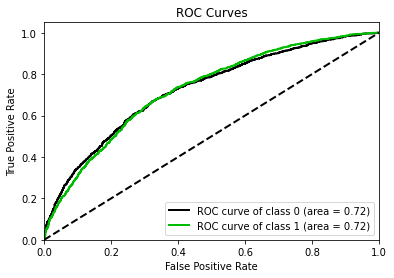

In [332]:
plot_roc(y_test, pred_proba, plot_micro=False, plot_macro=False)
plt.show()

Guardo el modelo por ser el mejor de la herramienta CatBoost, con un area por debajo de la curva de ROC de 0.68 y accruacy de 0.69.

In [270]:
CBC = model

In [ ]:
CBC

In [ ]:
y_pred_ = clf_weights.predict_proba(X_val)
plot_precision_recall(y_val, y_pred_, classes_to_plot=[1], plot_micro=False,)
plt.show()

---

**Features Importance:**

In [ ]:
# Features Importance:
model.get_feature_importance()

array([ 1.42305413,  6.47460657,  0.27789562, 16.42199743,  5.31584809,
        0.52097035,  1.19252581,  0.24426414,  6.07422042,  0.47896996,
        7.24929919,  0.92678564,  0.93007768,  5.06904886,  2.80373847,
       11.62592016,  0.81652468,  2.55957253,  0.40044687,  0.46759358,
        0.84279244,  0.44967682,  1.60175656,  1.36232127,  4.36296432,
        5.07180864,  1.49196337,  0.42056684,  3.788468  ,  9.33432156])

In [ ]:
pd.DataFrame(model.get_feature_importance(),X_train.columns)

,0
SEXO,1.423054
EDAD,6.474607
NACIO,0.277896
RAMA,16.421997
T_UNIV,5.315848
DISCA,0.520970
LUG_RES_PAIS,1.192526
PAIS_NAC_PADRE,0.244264
ESTUDIOS_PADRE,6.074220
PAIS_NAC_MADRE,0.478970


Se presentan variables muy poco relevantes, estas son: NACIO, DISCA, PAIS_NAC_PADRE, PAIS_NAC_MADRE, OTRO_GRADO, DOCTORADO, CICLO_MED, MV_FUE.

---

**One Hot Encoding:**

Para probar con otros modelos de prediccion, tengo que hacer que todas las variables sean numericas. Para pasar de variables categoricas a numericas utilizo One Hot Encoding.

In [ ]:
X_train_ = pd.get_dummies(X_train, columns = cat_features)
X_test_ = pd.get_dummies(X_test, columns = cat_features)

In [ ]:
X_train_.head()

,NUM_EST,IDIOMAS,FORMAC_TR,F_TEOR_TR,F_PRAC_TR,F_IDIOM_TR,F_TECH_TR,F_PERSON_TR,F_GEST_TR,SEXO_H,...,EST_CIVIL_1_S,EST_CIVIL_2_C,EST_CIVIL_3_V,EST_CIVIL_4_SE,EST_CIVIL_5_D,HOGAR_1_UNI,HOGAR_2_ScH,HOGAR_3_PsH,HOGAR_4_PcH,HOGAR_5_Otr
1069,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
12000,0,1,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,1
2404,0,2,3,2,5,4,4,4,4,0,...,1,0,0,0,0,0,0,0,0,1
11833,0,2,4,1,1,4,5,4,4,1,...,1,0,0,0,0,0,0,0,1,0
12670,1,2,3,2,5,5,4,3,5,1,...,1,0,0,0,0,1,0,0,0,0


Ojo, una vez probado el modelo haria features importance para alivianar un poco la base. Ahora quedo con 97 columnas...

---

 - **Random Forest:**

In [126]:
# !pip install mlxtend

In [127]:
from mlxtend.plotting import plot_decision_regions
from sklearn.ensemble import RandomForestClassifier

In [197]:
model = RandomForestClassifier()

In [198]:
model.fit(X_train_, y_train)

/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_63383/3623761159.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train_, y_train)


RandomForestClassifier()

In [199]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.514
              precision    recall  f1-score   support

           0       0.48      0.19      0.27      1743
           1       0.57      0.84      0.68      2238

    accuracy                           0.55      3981
   macro avg       0.52      0.51      0.48      3981
weighted avg       0.53      0.55      0.50      3981

[[ 333 1410]
 [ 366 1872]]


El Catboost es mejor

---

- **Adaboost:**

In [202]:
from sklearn.ensemble import AdaBoostClassifier

In [203]:
model = AdaBoostClassifier()

In [205]:
model = model.fit(X_train_, y_train)

/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [206]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.503
              precision    recall  f1-score   support

           0       0.54      0.02      0.03      1743
           1       0.56      0.99      0.72      2238

    accuracy                           0.56      3981
   macro avg       0.55      0.50      0.37      3981
weighted avg       0.55      0.56      0.42      3981

[[  28 1715]
 [  24 2214]]


El Catboost es mejor

---

- **Decision Tree:**

In [423]:
from sklearn.tree import DecisionTreeClassifier

In [425]:
model = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
model.fit(X_train_, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [426]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.507
              precision    recall  f1-score   support

           0       0.43      0.44      0.44      1686
           1       0.58      0.57      0.58      2295

    accuracy                           0.52      3981
   macro avg       0.51      0.51      0.51      3981
weighted avg       0.52      0.52      0.52      3981

[[ 742  944]
 [ 979 1316]]


/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- EDAD_1_<30
- TR_SUELDO_1_<700
Feature names seen at fit time, yet now missing:
- EDAD_1_m30
- TR_SUELDO_1_m700

  warnings.warn(message, FutureWarning)


Es mejor el CatBoost.

---

- **LightGBM:**

In [400]:
#!conda install lightgbm

In [403]:
from lightgbm import LGBMClassifier

In [405]:
model = LGBMClassifier()
model.fit(X_train_,y_train)

/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_label.py:98: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/preprocessing/_label.py:133: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LGBMClassifier()

In [406]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.504
              precision    recall  f1-score   support

           0       0.44      0.13      0.19      1686
           1       0.58      0.88      0.70      2295

    accuracy                           0.56      3981
   macro avg       0.51      0.50      0.45      3981
weighted avg       0.52      0.56      0.49      3981

[[ 211 1475]
 [ 270 2025]]


Es mejor el Catboost.

---

- **XGBoost:**

In [402]:
#!pip install xgboost

In [407]:
from xgboost import XGBClassifier

In [414]:
X_train_.columns = X_train_.columns.str.replace("<", "m")

In [416]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.503
              precision    recall  f1-score   support

           0       0.43      0.28      0.34      1686
           1       0.58      0.72      0.64      2295

    accuracy                           0.54      3981
   macro avg       0.50      0.50      0.49      3981
weighted avg       0.51      0.54      0.51      3981

[[ 474 1212]
 [ 633 1662]]


Es mejor el Catboost.

---

**KNN:**

In [333]:
from sklearn.neighbors import KNeighborsClassifier

In [334]:
model = KNeighborsClassifier(n_neighbors=5, weights='uniform', metric='manhattan')

In [335]:
#Scale the data
scaler = MinMaxScaler()
scaler.fit(X_test_)
scaled = scaler.transform(X_test_)

In [336]:
model.fit(X_train_, y_train)

/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:200: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNeighborsClassifier(metric='manhattan')

In [338]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.497
              precision    recall  f1-score   support

           0       0.42      0.35      0.38      1704
           1       0.57      0.65      0.61      2277

    accuracy                           0.52      3981
   macro avg       0.50      0.50      0.49      3981
weighted avg       0.51      0.52      0.51      3981

[[ 592 1112]
 [ 804 1473]]


Es mejor el CatBoost

---

**SVM:**

In [427]:
from sklearn.svm import SVC

In [428]:
model = SVC(kernel = 'linear', random_state = 0)
model.fit(X_train_, y_train)

/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVC(kernel='linear', random_state=0)

In [429]:
pred = model.predict(X_test_)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- EDAD_1_<30
- TR_SUELDO_1_<700
Feature names seen at fit time, yet now missing:
- EDAD_1_m30
- TR_SUELDO_1_m700

  warnings.warn(message, FutureWarning)


ROC AUC: 0.500
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1686
           1       0.58      1.00      0.73      2295

    accuracy                           0.58      3981
   macro avg       0.29      0.50      0.37      3981
weighted avg       0.33      0.58      0.42      3981

[[   0 1686]
 [   0 2295]]


/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/anoguera/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Es mejor el CatBoost.

---

**PCA:**

Voy a reducir la dimensionalidad de la base con PCA para luego poder aplicar algoritmos de clustering.

In [274]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

Uso MinMaxScaler para normalizar todas las variables ya que al haber normalizado algunas de las variables con OneHotEncoding las unidades de las mismas no van a ser iguales y no tendran sentido las distancias calculadas.

In [275]:
#Scale the data
scaler = MinMaxScaler()
scaler.fit(X_train_)
scaled = scaler.transform(X_train_)

In [276]:
#Obtain principal components
pca = PCA(2).fit(scaled)

X_train_PCA = pca.transform(scaled)
pc1 = X_train_PCA[:,0]
pc2 = X_train_PCA[:,1]

Text(0, 0.5, 'PC2')

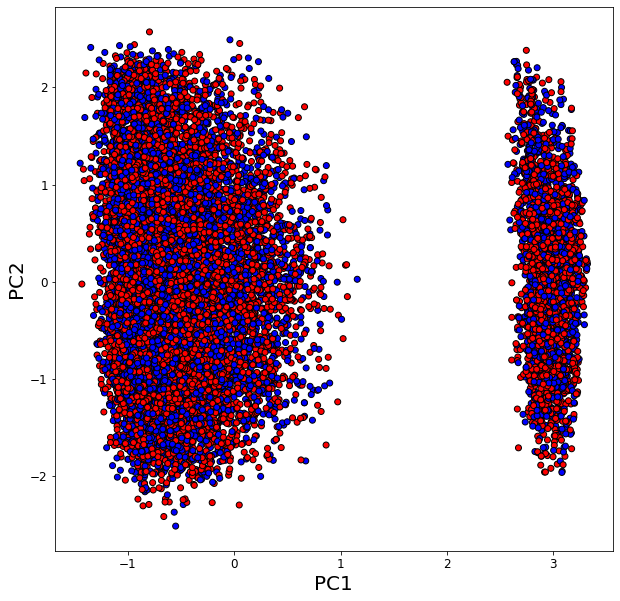

In [277]:
#Plot principal components
plt.figure(figsize=(10,10))

colour = ['red' if y == 1 else 'blue' for y in y_train['EMPLEADO_PRODUCTIVO']]
plt.scatter(pc1,pc2 ,c=colour,edgecolors='#000000')
plt.ylabel("Si",size=20)
plt.xlabel('No',size=20)
plt.yticks(size=12)
plt.xticks(size=12)
plt.xlabel('PC1')
plt.ylabel('PC2')

<BarContainer object of 2 artists>

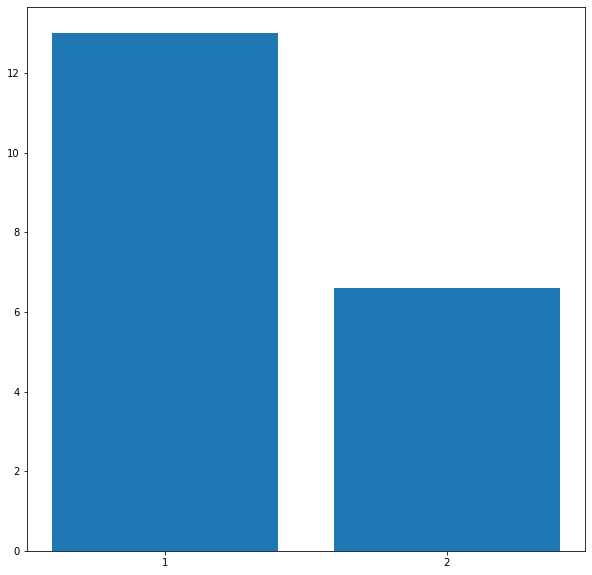

In [278]:
plt.figure(figsize=(10,10))
var = np.round(pca.explained_variance_ratio_*100, decimals = 1)
lbls = [str(x) for x in range(1,len(var)+1)]
plt.bar(x=range(1,len(var)+1), height = var, tick_label = lbls)

---

- **Random Forest con PCA:**

In [279]:
model = RandomForestClassifier()

In [280]:
model.fit(X_train_PCA, y_train)

/var/folders/6c/17qbm4nd5318hd4bcrx68wjh0000gn/T/ipykernel_63383/1607859020.py:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(X_train_PCA, y_train)


RandomForestClassifier()

In [281]:
#Scale the data
scaler = MinMaxScaler()
scaler.fit(X_test_)
scaled = scaler.transform(X_test_)

In [282]:
#Obtain principal components
pca = PCA(2).fit(scaled)

X_test_PCA = pca.transform(scaled)

In [283]:
pred = model.predict(X_test_PCA)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_test, pred))
print(metrics.classification_report(y_test, pred))
print(metrics.confusion_matrix(y_test, pred))

ROC AUC: 0.500
              precision    recall  f1-score   support

           0       0.44      0.35      0.39      1743
           1       0.56      0.65      0.60      2238

    accuracy                           0.52      3981
   macro avg       0.50      0.50      0.50      3981
weighted avg       0.51      0.52      0.51      3981

[[ 617 1126]
 [ 793 1445]]


---

**Clustering:**

A partir del PCA, hago clustering con K-means.

In [284]:
from sklearn.cluster import KMeans

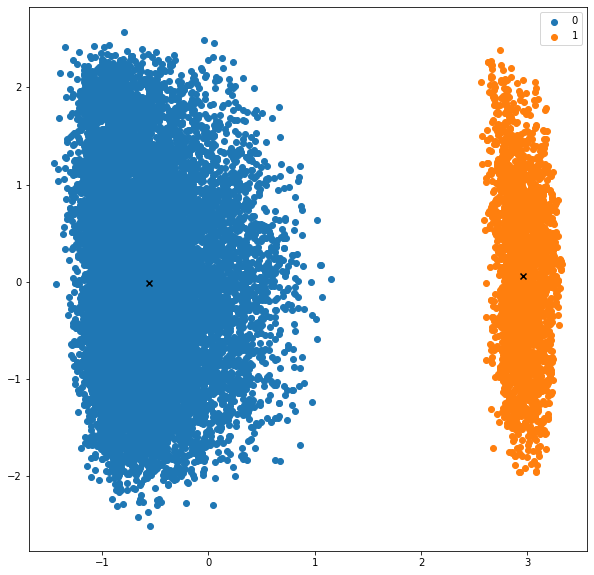

In [287]:
model = KMeans(n_clusters = 2, init = "k-means++")
label = model.fit_predict(X_train_PCA)
centers = np.array(model.cluster_centers_)
plt.figure(figsize=(10,10))
uniq = np.unique(label)
for i in uniq:
   plt.scatter(X_train_PCA[label == i , 0] , X_train_PCA[label == i , 1] , label = i)
plt.scatter(centers[:,0], centers[:,1], marker="x", color='k')
#This is done to find the centroid for each clusters.
plt.legend()
plt.show()

In [290]:
pred = model.predict(X_test_PCA)

In [291]:
accuracy_score(y_test, pred)

0.4604370761115298

In [292]:
print(confusion_matrix(y_test, pred))

[[1486  257]
 [1891  347]]


Si se encuentra una diferenciacion segun los componentes del PCA, pero no representa la diferenciacion del target. 

---

**Salida:**

In [422]:
#!pip install scikitplot

In [418]:
from scikitplot.metrics import plot_roc, plot_confusion_matrix, plot_precision_recall

In [387]:
X_va, X, y_va, y = train_test_split(df_va.iloc[:,1:44], df_va['EMPLEADO_PRODUCTIVO'], test_size=0.0000001)

print(X_va.shape), print(y_va.shape)
print(X.shape), print(y.shape)

(4973, 43)
(4973,)
(1, 43)
(1,)


(None, None)

In [388]:
X_va = X_va.drop(['SIT_LABORAL', 'SIT_PROFESIONAL', 'TR_SUELDO', 'FORMAC_TR', 'RAMA_TR', 'USO_ESTUD_TR', 'F_TEOR_TR', 'F_PRAC_TR', 'F_IDIOM_TR', 'F_TECH_TR', 'F_PERSON_TR', 'F_GEST_TR', 'OTRO_TRAB'], axis=1)

In [389]:
y_va = pd.get_dummies(y_va).drop(columns='No').rename(columns = {'Si':'EMPLEADO_PRODUCTIVO'})

In [420]:
pred = CBC.predict(X_va)
print('ROC AUC: %.3f' % metrics.roc_auc_score(y_va, pred))
print(metrics.classification_report(y_va, pred))
print(metrics.confusion_matrix(y_va, pred))

ROC AUC: 0.663
              precision    recall  f1-score   support

           0       0.65      0.55      0.60      2146
           1       0.69      0.78      0.73      2827

    accuracy                           0.68      4973
   macro avg       0.67      0.66      0.66      4973
weighted avg       0.68      0.68      0.67      4973

[[1180  966]
 [ 634 2193]]


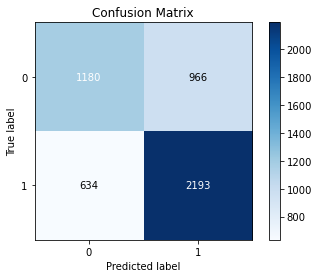

In [421]:
plot_confusion_matrix(y_va, pred, normalize=False)
plt.show()